# Projeto Marinha do Brasil

## Laboratório de Processamento de Sinais - UFRJ

### Autor: Vinícius dos Santos Mello <viniciusdsmello@poli.ufrj.br>

#### Notebook destinado a análise de Pré Treinamento dos Stacked Autoencoder (SAE)

In [1]:
import os
import sys
import time
import sys
import time
import multiprocessing
import pprint 

import numpy as np
from datetime import datetime, timedelta

from Packages.NoveltyDetection.setup.noveltyDetectionConfig import CONFIG
from SAENoveltyDetectionAnalysis import SAENoveltyDetectionAnalysis
from Functions.telegrambot import Bot

num_processes = multiprocessing.cpu_count()

my_bot = Bot("lisa_thebot")

# Enviroment variables
data_path = CONFIG['OUTPUTDATAPATH']
results_path = CONFIG['PACKAGE_NAME']

training_params = {
    "Technique": "VariationalAutoencoder"
}

analysis = SAENoveltyDetectionAnalysis(parameters=training_params,
                                       load_hash=True, load_data=True, verbose=False)
all_data, all_trgt, trgt_sparse = analysis.getData()

SAE = analysis.createSAEModels()

trn_data = analysis.trn_data
trn_trgt = analysis.trn_trgt
trn_trgt_sparse = analysis.trn_trgt_sparse

Using TensorFlow backend.


Reading from /home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/StackedAutoEncoder/outputs/3aa7b6b2a784922c348292561edca3d5201d6d6567f727e6ce7e403d7f175b10/parameters.json
[+] Time to read data file: 1.064500093460083 seconds
Balacing data...
DataHandler Class: CreateEventsForClass
Original Size: (12939, 400)
DataHandler Class: CreateEventsForClass
Original Size: (29352, 400)
DataHandler Class: CreateEventsForClass
Original Size: (11510, 400)
DataHandler Class: CreateEventsForClass
Original Size: (23760, 400)


In [ ]:
pp = pprint.PrettyPrinter(indent=1)
print(analysis.model_hash)
print(analysis.getBaseResultsPath())
pp.pprint(analysis.parameters)

### Lofargram (Original vs Reconstructed data)

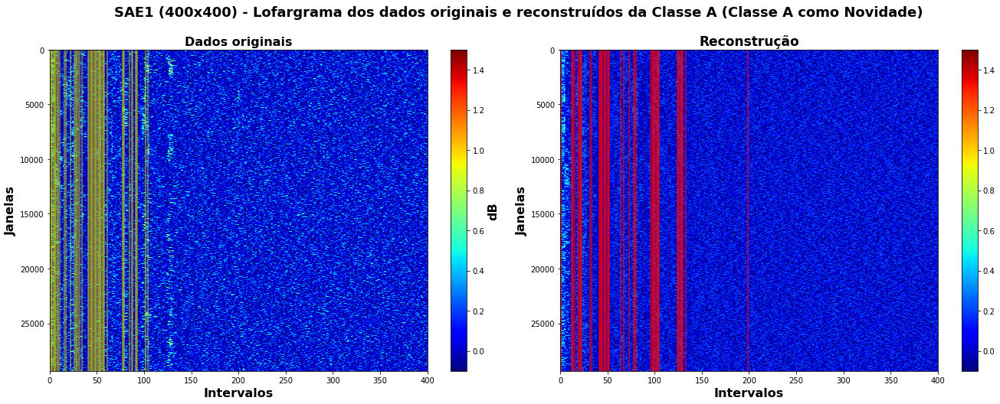

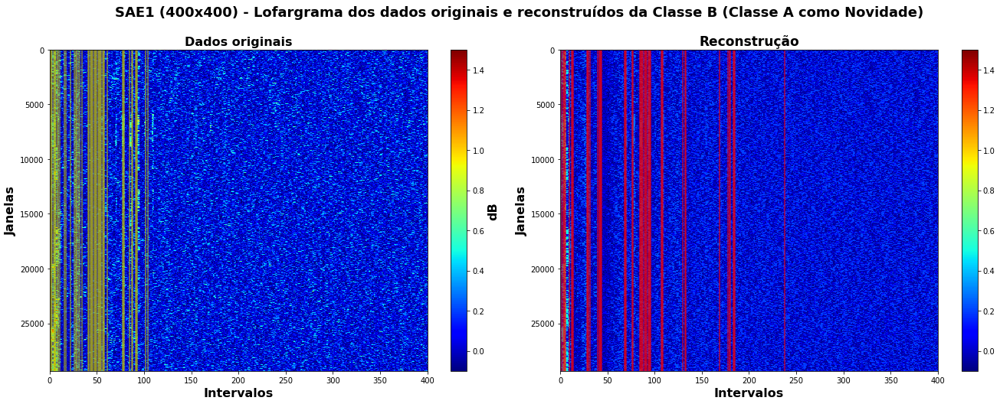

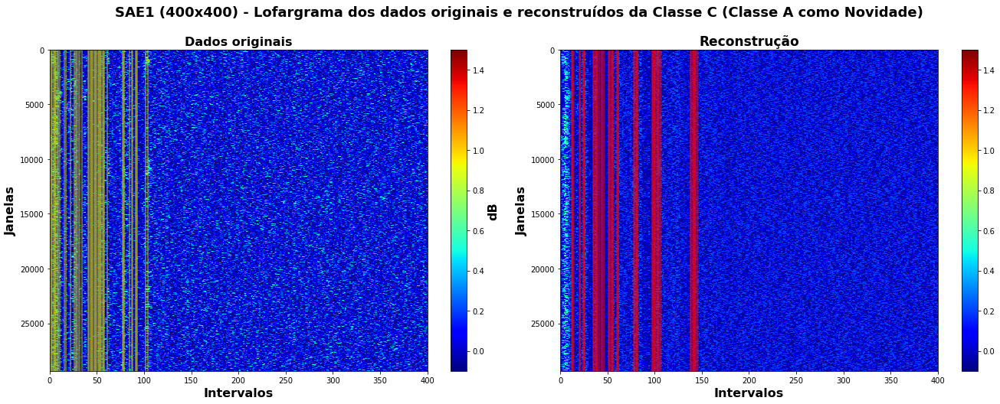

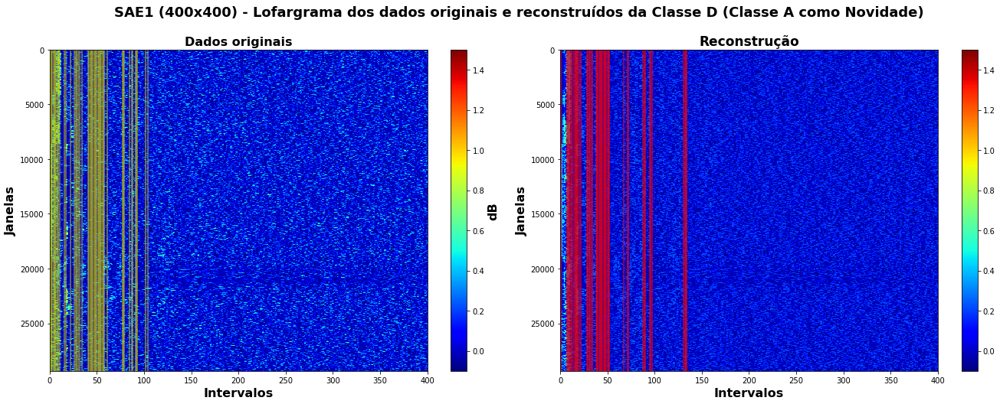

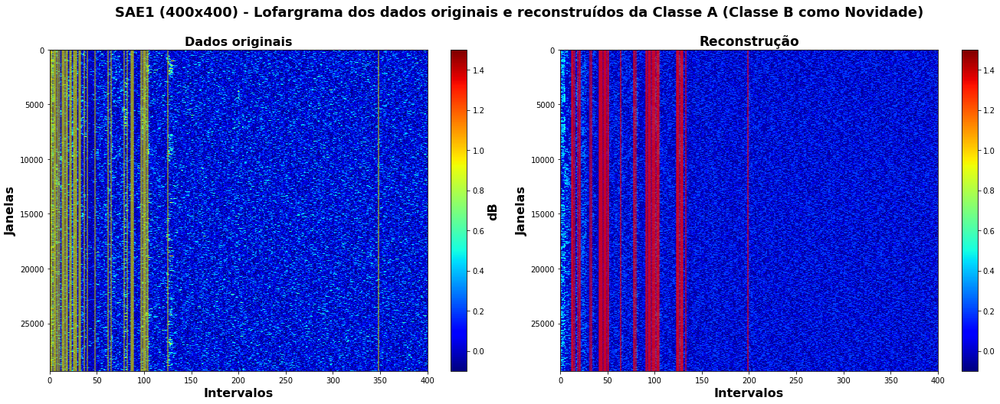

...

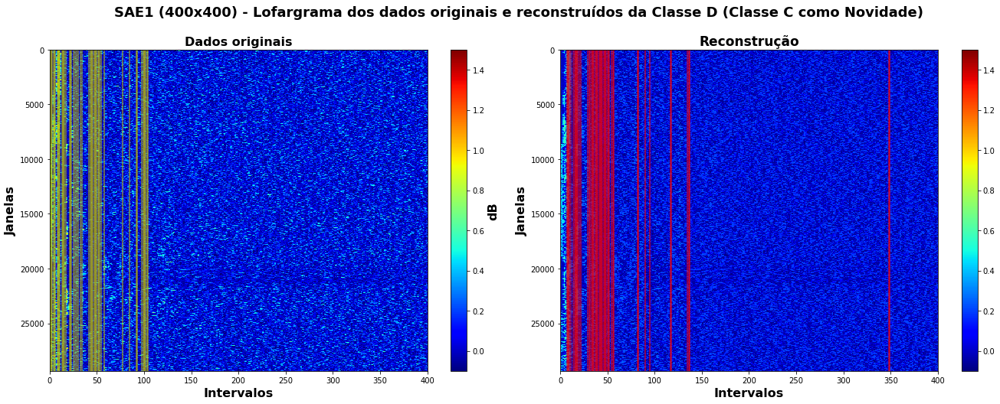

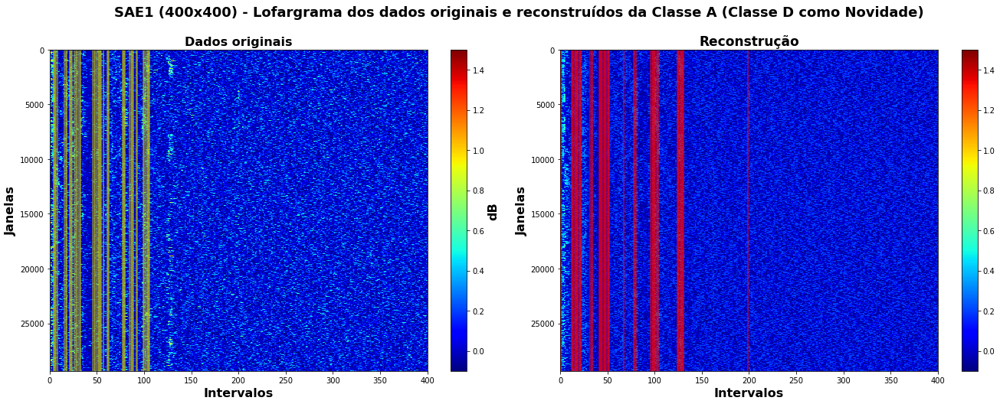

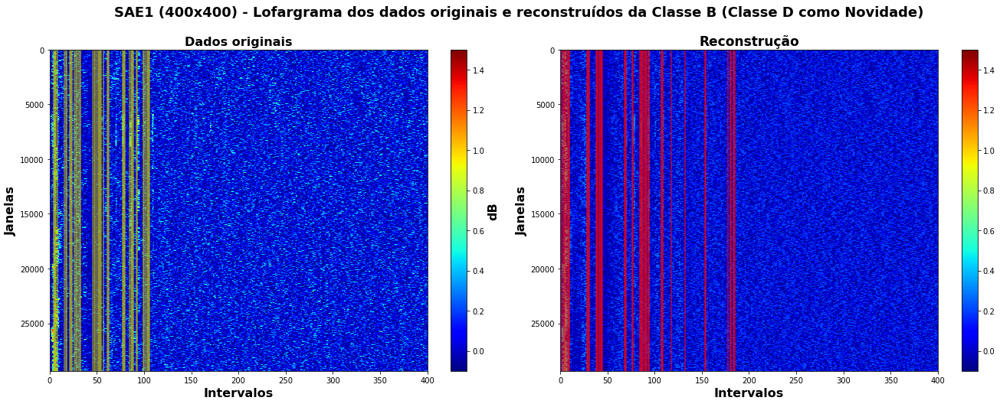

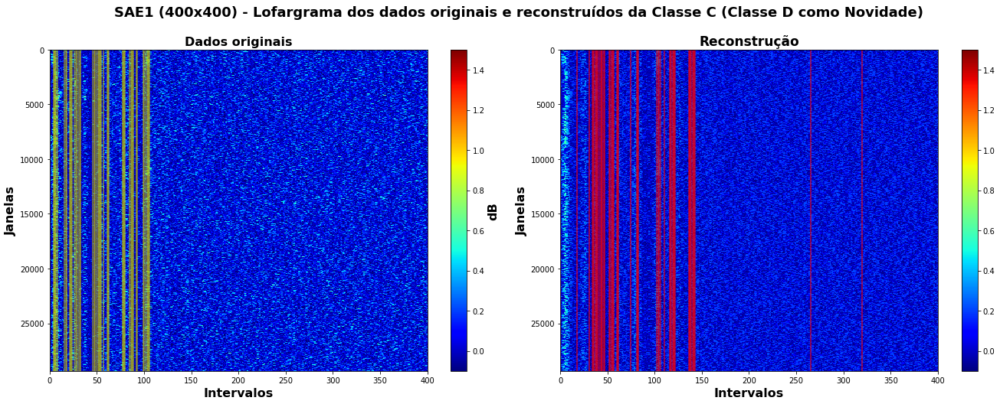

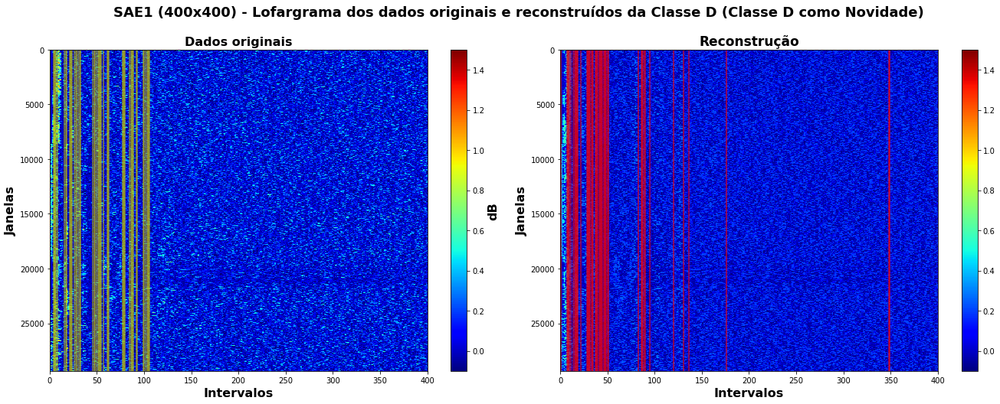

In [18]:
# LOFARGRAM
%matplotlib inline 

from sklearn import metrics
from sklearn import preprocessing
from sklearn.externals import joblib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

language = 'portuguese'

plot_title = {
    'portuguese': {
        'analysis_name': 'SAE{0} ({4}) - Lofargrama dos dados originais e reconstruídos da Classe {1} (Classe {2} como Novidade)',
        'original': 'Dados originais',
        'reconstructed': 'Reconstrução'
    },
    'english': {
        'analysis_name': 'SAE{0} ({4}) - Lofagram of original and reconstructed data of Class {1} (Class {2} as Novelty)',
        'original': 'SAE{0} - Original Data',
        'reconstructed': 'SAE{0} - Reconstructed Data'
    }
}

plot_axes_labels = {
    'portuguese': {
        'x': 'Intervalos',
        'y': 'Janelas'
    },
    'english': {
        'x': 'Bins',
        'y': 'Windows'
    }
}

# Choose model
layer = 1

hidden_neurons = [400]

points = 50

files_to_send=[]

from sklearn.externals import joblib
[relevance_features] = joblib.load('/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/relevance_features_results_1_layer_400x50.jbl')

def getLofargram(ifold, inovelty, iclass, cbar_clim, printLines=False):
    indexes = {}
    
    neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
    
    train_id, test_id = analysis.CVO[inovelty][ifold]
    
    scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
    data = scaler.transform(all_data[all_trgt==iclass])

    model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                    hidden_neurons=hidden_neurons[:layer],
                                    layer=layer, ifold=ifold)
    
    output = model.predict(data)
    
    diffSquared = np.zeros([data.shape[0], data.shape[1]])
    
    diffSquared = np.power((data - output), 2)
    
    data = scaler.inverse_transform(data)
    output = scaler.inverse_transform(output)
    
    mean = np.mean(diffSquared[:,:], axis=0)
    indexes = np.argsort(mean)[::-1]
    
    m_fontsize = 16
    
    fig = plt.figure(1, figsize=(20,8))
    
    fig.suptitle(plot_title[language]['analysis_name'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty], ifold, neurons_str),
                 fontsize=18,
                 fontweight="bold")
                 
    gs1 = gridspec.GridSpec(1, 2)
    ax_list = [fig.add_subplot(ss) for ss in gs1]

    im = ax_list[0].imshow(data,
                           cmap="jet",extent=[1, 400, data.shape[0],1],
                           aspect="auto")
    ax_list[0].set_title(plot_title[language]['original'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty]), fontsize= m_fontsize, fontweight="bold")

    ax_list[0].set_ylabel(plot_axes_labels[language]['y'], fontsize= m_fontsize, fontweight="bold")
    ax_list[0].set_xlabel(plot_axes_labels[language]['x'], fontsize= m_fontsize, fontweight="bold")
    
    ax_list[0].set_xticks(np.linspace(0,data.shape[1],9))
    
    # Plot lines at frequencies with highest relevance
    level = 'all'
    if printLines:
        for index in relevance_features[analysis.getClassLabels()[inovelty]][level][:points]:
            ax_list[0].axvline(index, color='y', alpha=0.7)
    
    ax = ax_list[0]
    cbar = fig.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('dB',fontweight='bold',fontsize= m_fontsize) 
    if cbar_clim is not None:
        im.set_clim(cbar_clim[0],cbar_clim[1])

    ##############################################################################
    im = ax_list[1].imshow(output,
                           cmap="jet",extent=[1, 400, output.shape[0],1],
                           aspect="auto")
    ax_list[1].set_title(plot_title[language]['reconstructed'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty]),
              fontsize= m_fontsize+1,
              fontweight="bold")
    ax_list[1].set_ylabel(plot_axes_labels[language]['y'], fontsize= m_fontsize, fontweight="bold")
    ax_list[1].set_xlabel(plot_axes_labels[language]['x'], fontsize= m_fontsize, fontweight="bold")
    
    ax_list[1].set_xticks(np.linspace(0,data.shape[1],9))
    

    # Plot lines at frequencies with highest errors
    if printLines: 
        for index in indexes[:points]:
            ax_list[1].axvline(index, color='r', alpha=0.7)

    ax = ax_list[1]
    fig.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('dB',fontweight='bold',fontsize= m_fontsize) 
    if cbar_clim is not None:
        im.set_clim(cbar_clim[0],cbar_clim[1])
    
    ##############################################################################
    
    plt.tight_layout(pad=5, w_pad=0.5, h_pad=2)

    #Save the figure
#     analysis_name = 'lofargram_{}_layer_{}_inovelty_{}_class'.format(layer, inovelty, iclass)
    novelty_class = analysis.getClassLabels()[inovelty]
    class_label = analysis.getClassLabels()[iclass]
    if printLines:
        analysis_name = f'lofargram_originalreconstruction_error_bins_sae{layer}_{neurons_str}_class{class_label}_novelctyClass{novelty_class}'
    else: 
        analysis_name = f'lofargram_originalreconstruction_sae{layer}_{neurons_str}_class{class_label}_novelctyClass{novelty_class}'
    
#     file_name = os.path.join(analysis.pictures_output_folder, analysis_name+"_{}_neurons_{}_ifold.png".format(neurons_str,ifold))
    
    file_name = os.path.join(analysis.pictures_output_folder, analysis_name+".png")
    
    files_to_send.append(file_name)
    
    plt.savefig(file_name, format="png")
    plt.show()
    return file_name

# getLofargram(ifold=ifold, inovelty=inovelty, iclass=0)
for ifold in [0]:
    for inovelty in [0,1,2,3]:#[range(len(analysis.getClassLabels()))]:
        for iclass in [0,1,2,3]:#range(len(analysis.getClassLabels())):
            file_name = getLofargram(ifold=ifold, inovelty=inovelty, iclass=iclass, cbar_clim=(-0.1,1.5),
                                     printLines=False)
            try:
                neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
                my_bot.sendMessage(message=plot_title[language]['analysis_name'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty], ifold, neurons_str),
                                   imgPath=file_name)
            except Exception as e:
                print("Error when sending message to the Bot: {}".format(str(e)))

                file_name = getLofargram(ifold=ifold, inovelty=inovelty, iclass=iclass, cbar_clim=(-0.1,1.5),
                                         printLines=True)
            try:
                neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
                my_bot.sendMessage(message=plot_title[language]['analysis_name'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty], ifold, neurons_str),
                                   imgPath=file_name)
            except Exception as e:
                print("Error when sending message to the Bot: {}".format(str(e)))



In [19]:
import shutil

destFolder = os.path.join(os.getcwd(), 'Download')
for ifile in files_to_send:
    filename = ifile.split('/')[-1]
    print(filename)
    shutil.move(ifile, os.path.join(destFolder, filename))
shutil.make_archive(destFolder, 'zip', destFolder) 

lofargram_originalreconstruction_error_bins_sae1_400x400_classA_novelctyClassA.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classB_novelctyClassA.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classC_novelctyClassA.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classD_novelctyClassA.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classA_novelctyClassB.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classB_novelctyClassB.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classC_novelctyClassB.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classD_novelctyClassB.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classA_novelctyClassC.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classB_novelctyClassC.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classC_novelctyClassC.png
lofargram_originalreconstruction_error_bins_sae1_400x400_classD_novelctyClassC.png
lofa

'/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Packages/NoveltyDetection/StackedAutoEncoders/Download.zip'

### Matriz de interseção dos bins relevantes

In [107]:
import pandas as pd
from sklearn.externals import joblib
[relevance_features] = joblib.load('/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/relevance_features_results_1_layer_400x50.jbl')

np.intersect1d(relevance_features[analysis.getClassLabels()[1]]['all'], relevance_features[analysis.getClassLabels()[2]]['all']).shape[0]/relevance_features[analysis.getClassLabels()[2]]['all'].shape[0]

intersection_matrix = np.zeros((4,4))
for inovelty in range(len(analysis.getClassLabels())):
    for iclass in range(len(analysis.getClassLabels())):
        x = relevance_features[analysis.getClassLabels()[iclass]]['all']
        y = relevance_features[analysis.getClassLabels()[inovelty]]['all']
        intersection_matrix[inovelty, iclass] = np.intersect1d(x,y).shape[0]/max(x.shape[0],y.shape[0])

df_intersection = pd.DataFrame(intersection_matrix, columns=["Classe " + x for x in analysis.getClassLabels()])
df_intersection['Classe Novidade'] = ["Classe " + x for x in analysis.getClassLabels()]
df_intersection.set_index('Classe Novidade', inplace=True)

def convert(x):
    
    return x.apply(lambda x: "%.2f" % x)

(df_intersection*100).apply(convert)

,Classe A,Classe B,Classe C,Classe D
Classe Novidade,,,,
Classe A,100.00,89.36,57.58,68.26
Classe B,89.36,100.00,55.74,69.19
Classe C,57.58,55.74,100.00,59.04
Classe D,68.26,69.19,59.04,100.00


In [ ]:
hidden_neurons = [400]
def get_plot(ifold, inovelty, iclass):
    
    neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
    
    train_id, test_id = analysis.CVO[inovelty][ifold]
    
    scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
    data = scaler.transform(all_data[all_trgt==iclass])

    model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                    hidden_neurons=hidden_neurons[:layer],
                                    layer=layer, ifold=ifold)
    
    output = model.predict(data)

    diffSquared = np.zeros([data.shape[0], data.shape[1]])
    
    diffSquared = np.power((data - output), 2)
      
    mean = np.mean(diffSquared[:,:], axis=0)
    
    fig = plt.figure(1, figsize=(14,12))
#     fig.suptitle(plot_title[language]['analysis_name'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty], ifold, neurons_str),
#                  fontsize=18,
#                  fontweight="bold")
                 
    gs1 = gridspec.GridSpec(3, 1)
    ax_list = [fig.add_subplot(ss) for ss in gs1]
    
    bins = np.round(np.arange(0,all_data.shape[1],1),3)
    ##############################################################################
    iplot = 0
    im = ax_list[iplot].plot(bins, mean, 
                            color='b', alpha=0.7, linewidth=2.5, label='Valor Médio')
    ax_list[iplot].set_ylabel('Erro Quadrático Médio', fontsize=18)
    ax_list[iplot].set_xlabel('Intervalo de Frequência', fontsize=18)
    
    ax_list[iplot].set_xlim(0,data.shape[1])
    ax_list[iplot].set_xticks(np.linspace(0,data.shape[1],9))
    

    # Plot lines at frequencies with highest errors
#     for index in indexes[:points]:
#         ax_list[1].axvline(index, color='r', alpha=0.7)
    
    ##############################################################################
    iplot = 1
    relevance_analysis_file = '/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/feature_relevance_analysis_1_layer_400x50.jbl'
    reference_sp, sp_per_bin = joblib.load(relevance_analysis_file)

    reference_mean_sp = np.mean(reference_sp[inovelty,:], axis=0)
    mean_sp = np.mean(sp_per_bin[inovelty,:], axis=0)
    error_sp = np.std(sp_per_bin[inovelty,:,:], axis=0)
    
    relative_sp = ((mean_sp-(np.ones(mean_sp.shape)*reference_mean_sp))/reference_mean_sp)*100
    
    im = ax_list[iplot].plot(bins, relative_sp, 
                             color='b', alpha=0.7, linewidth=2.5, label='Indice SP Relativo')
    ax_list[iplot].set_ylabel('$\Delta SP (\%)$', fontsize=18)
    ax_list[iplot].set_xlabel('Intervalo de Frequência', fontsize=18)
    
    ax_list[iplot].set_xlim(0,data.shape[1])
    ax_list[iplot].set_xticks(np.linspace(0,data.shape[1],9))
    
    ax_list[iplot].grid()
    ax_list[iplot].legend()
    
    ###################################################################
    iplot = 2
    im = ax_list[iplot].bar(bins, np.mean(output, axis=0), 
                        color='b', alpha=0.7, linewidth=2.5, label='Valor Médio')
    ax_list[iplot].set_ylabel('Valor Médio no Intervalo', fontsize=18)
    ax_list[iplot].set_xlabel('Intervalo de Frequência', fontsize=18)
    
    ax_list[iplot].set_xlim(0,data.shape[1])
    ax_list[iplot].set_xticks(np.linspace(0,data.shape[1],9))
    
    ax_list[iplot].grid()
    ax_list[iplot].legend()
    
    ###################################################################
    plt.tight_layout()
    
    #Save the figure
#     analysis_name = 'lofargram_{}_layer_{}_inovelty_{}_class'.format(layer, inovelty, iclass)
#     file_name = os.path.join(analysis.pictures_output_folder, analysis_name+"_{}_neurons_{}_ifold.png".format(neurons_str,ifold))
    
#     plt.savefig(file_name, format="png")
    plt.show()
    return file_name
get_plot(0,1,0)

# Comparação de MSE e EMSE para múltiplas camadas

In [29]:
from sklearn.externals import joblib
from sklearn import metrics
from Functions.StatisticalAnalysis import KLDiv, EstPDF
import pandas as pd
import matplotlib.pyplot as plt

[relevance_features] = joblib.load('/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/relevance_features_results_1_layer_400x50.jbl')

inovelty = 0
ifold = 0
iclass = 1
layer = 1

topologies = {
    1: [400],
    4: [400,350,300,250],
    8: [400,350,300,250,200,150,100,50]
}

mse_df = pd.DataFrame(columns=['layer', 'class', 'fold','mse','emse_all','emse_tight','emse_medium','emse_loose'])

for layer in topologies.keys():
    hidden_neurons = topologies[layer]
    for inovelty in range(len(analysis.getClassLabels())):
        def get_plot(ifold, inovelty):
            neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
            print('Novelty Class: {} - Fold: {} - Layer: {} - Topology: {}'.format(analysis.getClassLabels()[inovelty], ifold, layer, neurons_str))
            relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()
            signal_bins={}
            noise_bins={}
            for level in relevance_levels:
                signal_bins[level] = []
                noise_bins[level] = []
                for ibin in range(trn_data[inovelty].shape[1]):
                    if ibin in relevance_features[analysis.getClassLabels()[inovelty]][level]:
                        signal_bins[level].append(ibin)
                    else:
                        noise_bins[level].append(ibin)

            neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])

            train_id, test_id = analysis.CVO[inovelty][ifold]

            scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
            data = scaler.transform(trn_data[inovelty][test_id])
            print('Loading model')
            model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                            hidden_neurons=hidden_neurons[:layer],
                                            layer=layer, ifold=ifold)
            print('Model loaded')
            output = model.predict(data)
#             output = scaler.inverse_transform(output)
#             data = scaler.inverse_transform(data)

            relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()

            mse = metrics.mean_squared_error(data, output)
            
            emse = {}
            result = {}
            
            for level in relevance_levels:
                print('Level: {} -  Signal Bins: {}'.format(level,len(signal_bins[level])))
                emse[level] = metrics.mean_squared_error(data[:,signal_bins[level]],output[:,signal_bins[level]])

            return mse, emse
        
        def getResults(ifold):
            mse,emse = get_plot(ifold,inovelty)
            result = {
                'layer': layer,
                'class': analysis.getClassLabels()[inovelty], 
                'fold': ifold, 
                'mse': mse,
                'emse_all': emse['all'],
                'emse_tight': emse['tight'],
                'emse_medium': emse['medium'],
                'emse_loose': emse['loose']
            }
            return result
        
        results = []
        
        for i in range(analysis.n_folds):
            results.append(getResults(i))
        
        for result in results: 
            mse_df = mse_df.append(result, ignore_index=True)

analysis_name = "mse_emse_sae1_sae4_sae8_results_dataframe"
analysis_file = os.path.join(analysis.getBaseResultsPath(), "AnalysisFiles", analysis_name + ".csv")  

mse_df.sort_values(by=['layer', 'class', 'fold']).to_csv(analysis_file,index=False)
try: 
    my_bot.sendMessage(message="Results with Relevance Features obtained!", filePath=analysis_file)
except Exception as e:
    print("Error when sending message to the bot. Error: {}".format(str(e)))

Novelty Class: A - Fold: 0 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 1 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 2 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 3 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: B

In [90]:
for inovelty in range(len(analysis.getClassLabels())):
    column = 'emse_all'
    novelty_class = analysis.getClassLabels()[inovelty]
    # SAE 1
    mean = mse_df.query(f"layer==1 and novelty == '{novelty_class}'").groupby(['layer','novelty']).mean()[column].iloc[0]
    std = mse_df.query(f"layer==1 and novelty == '{novelty_class}'").groupby(['layer','novelty']).std()[column].iloc[0]
    sae1 = f'${mean: .3f}\pm{std: .3f}$'

    # SAE 4
    mean = mse_df.query(f"layer==4 and novelty == '{novelty_class}'").groupby(['layer','novelty']).mean()[column].iloc[0]
    std = mse_df.query(f"layer==4 and novelty == '{novelty_class}'").groupby(['layer','novelty']).std()[column].iloc[0]
    sae4 = f'${mean: .3f}\pm{std: .3f}$'

    # SAE 8
    mean = mse_df.query(f"layer==8 and novelty == '{novelty_class}'").groupby(['layer','novelty']).mean()[column].iloc[0]
    std = mse_df.query(f"layer==8 and novelty == '{novelty_class}'").groupby(['layer','novelty']).std()[column].iloc[0]
    sae8 = f'${mean: .3f}\pm{std: .3f}$'

    row = f'& \\textbf[Classe {novelty_class}]        & {sae1}                     & {sae4}                    & {sae8}                     \\\\\\\\ \\cline[2-5]'
    row = row.replace("\\\\","\\").replace('[','{').replace(']','}')
    print(row)

& \textbf{Classe A}        & $ 0.185\pm 0.011$                     & $ 0.329\pm 0.012$                    & $ 0.872\pm 0.018$                     \\ \cline{2-5}
& \textbf{Classe B}        & $ 0.183\pm 0.010$                     & $ 0.328\pm 0.011$                    & $ 0.870\pm 0.017$                     \\ \cline{2-5}
& \textbf{Classe C}        & $ 0.192\pm 0.016$                     & $ 0.333\pm 0.017$                    & $ 0.875\pm 0.026$                     \\ \cline{2-5}
& \textbf{Classe D}        & $ 0.186\pm 0.008$                     & $ 0.331\pm 0.010$                    & $ 0.872\pm 0.013$                     \\ \cline{2-5}


# Comparação de KL e EKL para múltiplas camadas

In [ ]:
from sklearn.externals import joblib
from sklearn import metrics
from Functions.StatisticalAnalysis import KLDiv, EstPDF
import pandas as pd
import matplotlib.pyplot as plt

[relevance_features] = joblib.load('/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/relevance_features_results_1_layer_400x50.jbl')

inovelty = 0
ifold = 0
iclass = 1
layer = 1

topologies = {
    1: [400],
    4: [400,350,300,250],
    8: [400,350,300,250,200,150,100,50]
}

kl_df = pd.DataFrame(columns=['layer', 'class', 'fold','kl','ekl_all','ekl_tight','ekl_medium','ekl_loose'])
n_bins = 100
def getKL(y_true, y_pred, bins=[]):

        if len(bins) == 0:
            bins = range(0,y_true.shape[1])    

        kl = np.zeros([len(bins)], dtype=object)
        for i, ibin in enumerate(bins):
            # Calculate KL Div for known data reconstruction
            y_true_freq = y_true[:,ibin]
            reconstructed_y_true = y_pred[:,ibin]

            m_bins = np.linspace(y_true_freq.min(), y_true_freq.max(), n_bins)

            kl[i] = KLDiv(y_true_freq.reshape(-1,1), reconstructed_y_true.reshape(-1,1),
                                   bins=m_bins, mode='kernel', kernel='epanechnikov',
                                   kernel_bw=0.1, verbose=False)
            kl[i] = kl[i][0]
        return kl

for layer in topologies.keys():
    hidden_neurons = topologies[layer]
    for inovelty in range(len(analysis.getClassLabels())):
        def get_plot(ifold, inovelty):
            neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
            print('Novelty Class: {} - Fold: {} - Layer: {} - Topology: {}'.format(analysis.getClassLabels()[inovelty], ifold, layer, neurons_str))
            relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()
            signal_bins={}
            noise_bins={}
            for level in relevance_levels:
                signal_bins[level] = []
                noise_bins[level] = []
                for ibin in range(trn_data[inovelty].shape[1]):
                    if ibin in relevance_features[analysis.getClassLabels()[inovelty]][level]:
                        signal_bins[level].append(ibin)
                    else:
                        noise_bins[level].append(ibin)

            neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])

            train_id, test_id = analysis.CVO[inovelty][ifold]

            scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
            data = scaler.transform(trn_data[inovelty][test_id])
            print('Loading model')
            model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                            hidden_neurons=hidden_neurons[:layer],
                                            layer=layer, ifold=ifold)
            print('Model loaded')
            output = model.predict(data)
            output = scaler.inverse_transform(output)
            data = scaler.inverse_transform(data)

            relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()

            kl = np.sum(getKL(data, output))
            
            ekl = {}
            result = {}
            
            for level in relevance_levels:
                print('Level: {} -  Signal Bins: {}'.format(level,len(signal_bins[level])))
                ekl[level] = np.sum(getKL(data, output, relevance_features[analysis.class_labels[inovelty]][level]))

            return kl, ekl
        
        def getResults(ifold):
            kl,ekl = get_plot(ifold,inovelty)
            result = {
                'layer': layer,
                'class': analysis.getClassLabels()[inovelty], 
                'fold': ifold, 
                'kl': kl,
                'ekl_all': ekl['all'],
                'ekl_tight': ekl['tight'],
                'ekl_medium': ekl['medium'],
                'ekl_loose': ekl['loose']
            }
            return result
        
        results = []
        
        for i in range(analysis.n_folds):
            results.append(getResults(i))
        
#         with multiprocessing.Pool(processes=2) as p:
#             results = p.map(getResults, list(range(analysis.n_folds)))
        
        for result in results: 
            kl_df = kl_df.append(result, ignore_index=True)

analysis_name = "kl_ekl_sae1_sae4_sae8_results_dataframe"
analysis_file = os.path.join(analysis.getBaseResultsPath(), "AnalysisFiles", analysis_name + ".csv")  

kl_df.sort_values(by=['layer', 'class', 'fold']).to_csv(analysis_file,index=False)
try: 
    my_bot.sendMessage(message="Results with Relevance Features obtained!", filePath=analysis_file)
except Exception as e:
    print("Error when sending message to the bot. Error: {}".format(str(e)))

Novelty Class: A - Fold: 0 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 1 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 2 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 3 - Layer: 1 - Topology: 400x400
Loading model
Model loaded
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: B

In [101]:
kl_df.rename(columns={'class': 'novelty'},inplace=True)
for inovelty in range(len(analysis.getClassLabels())):
    column = 'ekl_all'
    novelty_class = analysis.getClassLabels()[inovelty]
    # SAE 1
    mean = kl_df.query(f"layer==1 and novelty == '{novelty_class}'").groupby(['layer','novelty']).mean()[column].iloc[0]
    std = kl_df.query(f"layer==1 and novelty == '{novelty_class}'").groupby(['layer','novelty']).std()[column].iloc[0]
    sae1 = f'${mean: .3f}\pm{std: .3f}$'

    # SAE 4
    mean = kl_df.query(f"layer==4 and novelty == '{novelty_class}'").groupby(['layer','novelty']).mean()[column].iloc[0]
    std = kl_df.query(f"layer==4 and novelty == '{novelty_class}'").groupby(['layer','novelty']).std()[column].iloc[0]
    sae4 = f'${mean: .3f}\pm{std: .3f}$'

    # SAE 8
    mean = kl_df.query(f"layer==8 and novelty == '{novelty_class}'").groupby(['layer','novelty']).mean()[column].iloc[0]
    std = kl_df.query(f"layer==8 and novelty == '{novelty_class}'").groupby(['layer','novelty']).std()[column].iloc[0]
    sae8 = f'${mean: .3f}\pm{std: .3f}$'

    row = f'& \\textbf[Classe {novelty_class}]        & {sae1}                     & {sae4}                    & {sae8}                     \\\\\\\\ \\cline[2-5]'
    row = row.replace("\\\\","\\").replace('[','{').replace(']','}')
    print(row)

& \textbf{Classe A}        & $ 46.209\pm 0.261$                     & $ 47.140\pm 0.271$                    & $ 111.648\pm 1.791$                     \\ \cline{2-5}
& \textbf{Classe B}        & $ 46.424\pm 0.141$                     & $ 47.183\pm 0.267$                    & $ 110.639\pm 0.974$                     \\ \cline{2-5}
& \textbf{Classe C}        & $ 28.760\pm 0.074$                     & $ 29.208\pm 0.067$                    & $ 69.554\pm 1.253$                     \\ \cline{2-5}
& \textbf{Classe D}        & $ 35.190\pm 0.105$                     & $ 35.781\pm 0.152$                    & $ 84.956\pm 0.407$                     \\ \cline{2-5}


In [99]:
kl_df

,layer,class,fold,kl,ekl_all,ekl_tight,ekl_medium,ekl_loose
0,1,A,0,52.257518,46.520904,0.102004,0.102004,0.425899
1,1,A,1,52.139360,46.328606,0.132303,0.132303,0.454909
2,1,A,2,51.699429,45.977103,0.120592,0.120592,0.440636
3,1,A,3,51.715930,46.010139,0.132947,0.132947,0.477433
4,1,B,0,52.026921,46.391920,0.128905,0.128905,1.049173
5,1,B,1,52.234194,46.546405,0.170966,0.170966,1.052738
6,1,B,2,51.818749,46.237869,0.138191,0.138191,1.004484
7,1,B,3,52.236546,46.519321,0.132624,0.132624,0.978862
8,1,C,0,52.122356,28.706241,0.103667,0.196144,0.899902
9,1,C,1,52.253881,28.864159,0.167321,0.277046,0.962162


# FIM

In [ ]:
from sklearn.externals import joblib
from Functions.StatisticalAnalysis import KLDiv, EstPDF
import pandas as pd
import matplotlib.pyplot as plt

[relevance_features] = joblib.load('/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/relevance_features_results_1_layer_400x50.jbl')

inovelty = 0
ifold = 0
iclass = 1
layer = 1
        
hidden_neurons = [400]

def getKL(y_true, y_pred):
    kl = np.zeros([y_true.shape[1]], dtype=object)
    for ifrequency in range(0,y_true.shape[1]):
        # Calculate KL Div for known data reconstruction
        y_true_freq = y_true[:,ifrequency]
        reconstructed_y_true = y_pred[:,ifrequency]

        m_bins = np.linspace(y_true_freq.min(), y_true_freq.max(), n_bins)

        kl[ifrequency] = KLDiv(y_true_freq.reshape(-1,1), reconstructed_y_true.reshape(-1,1),
                               bins=m_bins, mode='kernel', kernel='epanechnikov',
                               kernel_bw=0.1, verbose=False)

        kl[ifrequency] = kl[ifrequency][0]
    return kl

topologies = {
    1: [400],
    4: [400,350,300,250],
    8: [400,350,300,250,200,150,100,50]
}

kl_div_df = pd.DataFrame(columns=['layer', 'class', 'fold',
                                  'SNR_KL_all','SNR_KL_tight','SNR_KL_medium','SNR_KL_loose'])

for layer in topologies.keys():
    hidden_neurons = topologies[layer]
    for inovelty in range(len(analysis.getClassLabels())):
        def get_plot(ifold, inovelty):
            neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
            print('Novelty Class: {} - Fold: {} - Layer: {} - Topology: {}'.format(analysis.getClassLabels()[inovelty], ifold, layer, neurons_str))
            relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()
            signal_bins={}
            noise_bins={}
            for level in relevance_levels:
                signal_bins[level] = []
                noise_bins[level] = []
                for ibin in range(trn_data[inovelty].shape[1]):
                    if ibin in relevance_features[analysis.getClassLabels()[inovelty]][level]:
                        signal_bins[level].append(ibin)
                    else:
                        noise_bins[level].append(ibin)

            neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])

            train_id, test_id = analysis.CVO[inovelty][ifold]

            scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
            data = scaler.transform(trn_data[inovelty][test_id])

            model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                            hidden_neurons=hidden_neurons[:layer],
                                            layer=layer, ifold=ifold)

            output = model.predict(data)
            output = scaler.inverse_transform(output)
            data = scaler.inverse_transform(data)

            relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()

            snr_original = {}
            snr_reconstruido = {}

            result = {}
            kl_div = {}
            for level in relevance_levels:
                snr_original[level] = data[:,signal_bins[level]].sum(axis=1) - data[:,noise_bins['all']].sum(axis=1)
                snr_reconstruido[level] = output[:,signal_bins[level]].sum(axis=1) - output[:,noise_bins['all']].sum(axis=1)

            for level in relevance_levels:
#                 print('Level: {} -  Signal Bins: {} - Diff: {}'.format(level,len(signal_bins[level]),snr_original[level] - snr_reconstruido[level]))
                print('Level: {} -  Signal Bins: {}'.format(level,len(signal_bins[level])))

                df = pd.DataFrame(snr_original)
                df2 = pd.DataFrame(snr_reconstruido)

                snr_df = pd.DataFrame()
                snr_df['Dado Original'] = df[level]
                snr_df['Dado Reconstruido'] = df2[level]

        #         ax = snr_df.plot.hist(bins=100, alpha=0.5, figsize=(10,8))
        #         ax.set_title('Distribuição da SNR - SAE{} ({}) - Classe {} como Novidade'.format(layer, neurons_str, analysis.getClassLabels()[inovelty]), fontsize=16)
        #         ax.set_xlabel('SNR (dB)', fontsize=16)
        #         ax.set_ylabel('Frequência', fontsize=16)

                n_bins = 100
                m_bins = np.linspace(snr_df.values[:,0].min(), snr_df.values[:,0].max(), n_bins)
                kl_div[level] = KLDiv(snr_df.values[:,0].reshape(-1, 1), 
                               snr_df.values[:,1].reshape(-1, 1),
                               bins=m_bins, mode='kernel', kernel='epanechnikov',
                               kernel_bw=0.1, verbose=False)[0]

        #         textstr = '\n'.join(('Intervalos de Sinal Considerados: %i' % len(signal_bins[level]),
        #                             ('Divergência KL: %f' % kl_div),
        #                             (r'$\mu_{Original} = %f$' % snr_df['Dado Original'].mean()),
        #                             (r'$\sigma_{Original} = %f$' % snr_df['Dado Original'].std()),
        #                             (r'$\mu_{Reconstruido} = %f$' % snr_df['Dado Reconstruido'].mean()),
        #                             (r'$\sigma_{Reconstruido} = %f$' % snr_df['Dado Reconstruido'].std())
        #                             ))

        #         # these are matplotlib.patch.Patch properties
        #         props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

        #         # place a text box in upper left in axes coords
        #         ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        #                 verticalalignment='top', bbox=props)
        #         plt.show()

            return kl_div
        for ifold in range(analysis.n_folds):
            kl = get_plot(ifold,inovelty)
            result = {
                'layer': layer,
                'class': analysis.getClassLabels()[inovelty], 
                'fold': ifold, 
                'SNR_KL_all': kl['all'],
                'SNR_KL_tight': kl['tight'],
                'SNR_KL_medium': kl['medium'],
                'SNR_KL_loose': kl['loose']
            }
            kl_div_df = kl_div_df.append(result, ignore_index=True)

analysis_name = "kl_snr_results_dataframe"
analysis_file = os.path.join(analysis.getBaseResultsPath(), "AnalysisFiles", analysis_name + ".csv")  

kl_div_df.sort_values(by=['layer', 'class', 'fold', 'relevance_level']).to_csv(analysis_file,index=False)
try: 
    my_bot.sendMessage(message="Neurons Variation Results with Relevance Features obtained!", filePath=analysis_file)
except Exception as e:
    print("Error when sending message to the bot. Error: {}".format(str(e)))

Novelty Class: A - Fold: 0 - Layer: 1 - Topology: 400x400
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 1 - Layer: 1 - Topology: 400x400
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 2 - Layer: 1 - Topology: 400x400
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: A - Fold: 3 - Layer: 1 - Topology: 400x400
Level: all -  Signal Bins: 356
Level: tight -  Signal Bins: 1
Level: medium -  Signal Bins: 1
Level: loose -  Signal Bins: 4
Level: veryloose -  Signal Bins: 11
Novelty Class: B - Fold: 0 - Layer: 1 - Topology: 400x400
Level: all -  Signal Bins: 357
Level: tight -  Signal Bins: 1
Leve

In [30]:
kl_bkp = kl_div_df.copy()
mean = kl_div_df.groupby(['layer', 'class']).mean()
std = kl_div_df.groupby(['layer', 'class']).std()

kl_snr_all = pd.DataFrame()
for col in ['SNR_KL_all']: #,'SNR_KL_loose','SNR_KL_medium','SNR_KL_tight']:
    kl_snr_all = '$' + mean[col].map('{:,.2f}'.format) + '\pm' + std[col].map('{:,.2f}'.format) + '$'


In [31]:
kl_snr_all

layer  class
1      A        $0.63\pm0.04$
       B        $0.67\pm0.08$
       C        $0.24\pm0.02$
       D        $0.36\pm0.01$
4      A        $0.51\pm0.08$
       B        $0.52\pm0.04$
       C        $0.22\pm0.02$
       D        $0.29\pm0.02$
8      A        $0.47\pm0.05$
       B        $0.44\pm0.06$
       C        $0.42\pm0.06$
       D        $0.41\pm0.04$
Name: SNR_KL_all, dtype: object

Novelty Class: A - Fold: 0
Level: all -  Signal Bins: 356 - Diff: [5.43156027 1.21850991 4.38611235 ... 4.64949915 4.14176078 6.04046985]
Level: tight -  Signal Bins: 1 - Diff: [ 0.21705918 -0.57289481 -0.3264904  ... -1.25801135 -1.20570662
  0.32217567]
Level: medium -  Signal Bins: 1 - Diff: [ 0.21705918 -0.57289481 -0.3264904  ... -1.25801135 -1.20570662
  0.32217567]
Level: loose -  Signal Bins: 4 - Diff: [ 0.19315623 -0.66289297 -0.52236591 ... -1.18058602 -0.67181642
  0.21215051]


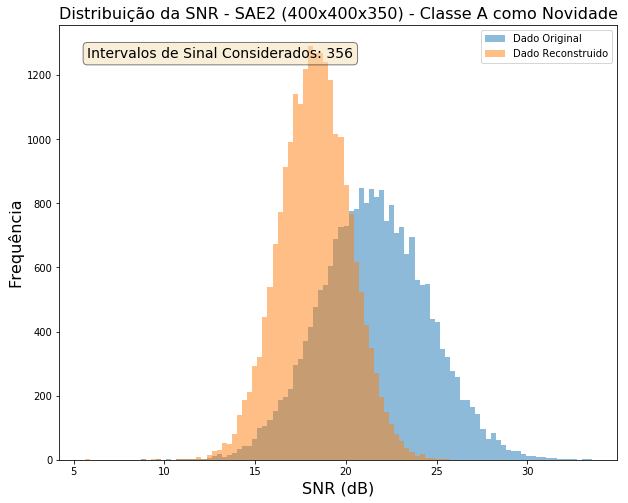

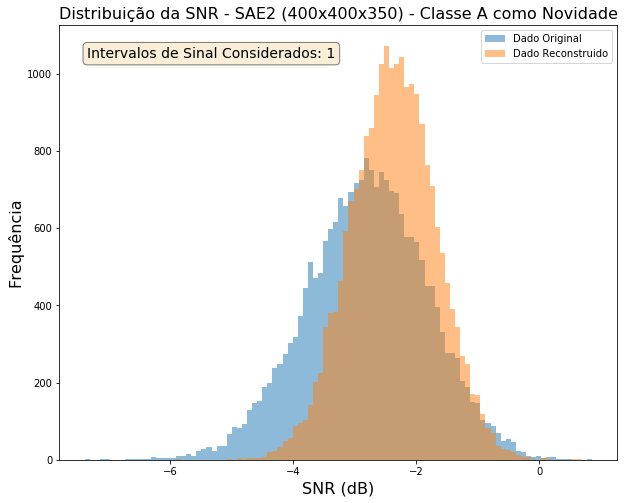

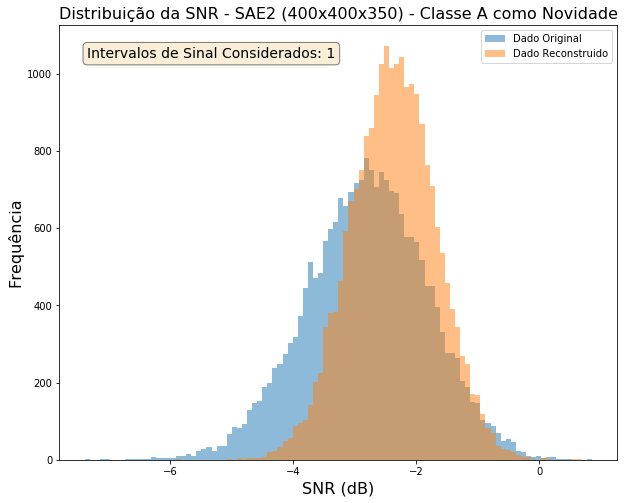

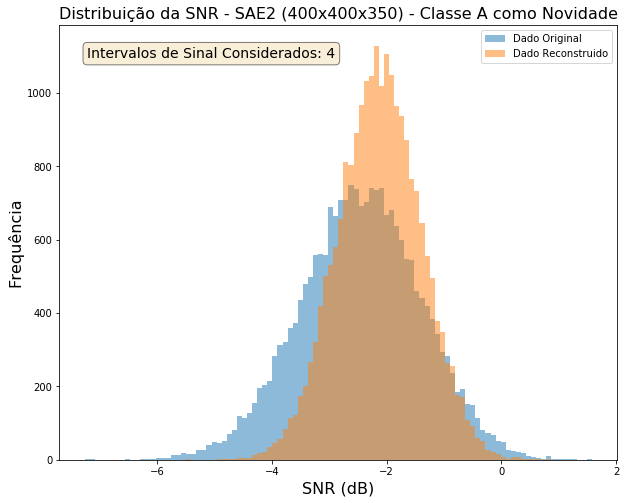

In [47]:
ifold = 0
inovelty = 0

snr_original, snr_reconstruido = get_plot(ifold,inovelty)
df = pd.DataFrame(snr_original)
df2 = pd.DataFrame(snr_reconstruido)
snr_df = pd.DataFrame()

relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()
signal_bins = {}
noise_bins = {}
for level in relevance_levels:
    snr_df['Dado Original'] = df[level]
    snr_df['Dado Reconstruido'] = df2[level]
    
    signal_bins[level] = []
    noise_bins[level] = []
    for ibin in range(trn_data[inovelty].shape[1]):
        if ibin in relevance_features[analysis.getClassLabels()[inovelty]][level]:
            signal_bins[level].append(ibin)
        else:
            noise_bins[level].append(ibin)

    ax = snr_df.plot.hist(bins=100, alpha=0.5, figsize=(10,8))
    ax.set_title('Distribuição da SNR - SAE{} ({}) - Classe {} como Novidade'.format(layer, neurons_str, analysis.getClassLabels()[inovelty]), fontsize=16)
    ax.set_xlabel('SNR (dB)', fontsize=16)
    ax.set_ylabel('Frequência', fontsize=16)
    
    textstr = '\n'.join(('Intervalos de Sinal Considerados: %i' % len(signal_bins[level]),))
    
    # these are matplotlib.patch.Patch properties
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)

Novelty Class: B - Fold: 0


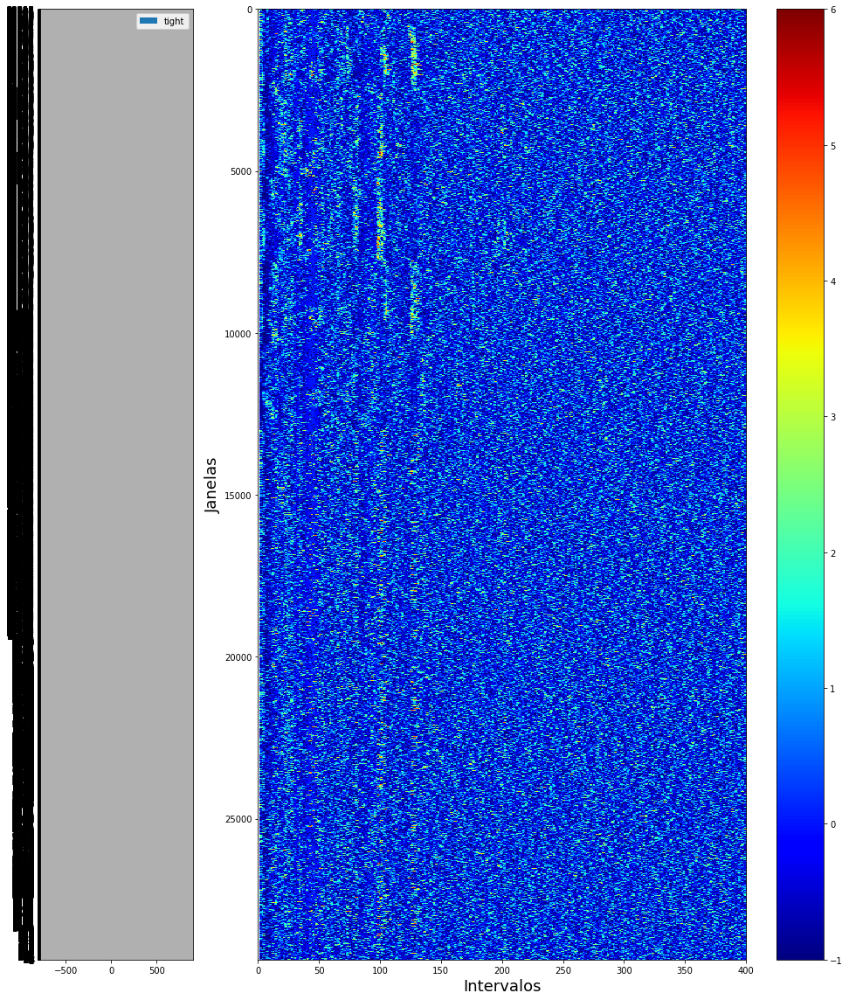

In [79]:
## LOFARGRAM
%matplotlib inline 

from sklearn import metrics
from sklearn import preprocessing
from sklearn.externals import joblib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

language = 'portuguese'

plot_title = {
    'portuguese': {
        'analysis_name': 'SAE{0} ({4}) - Lofargrama dos dados reconstruídos da Classe {1} (Classe {2} como Novidade)',
        'original': 'Dados originais',
        'reconstructed': 'Reconstrução'
    },
    'english': {
        'analysis_name': 'SAE{0} ({4}) - Lofagram of reconstructed data of Class {1} (Class {2} as Novelty)',
        'original': 'SAE{0} - Original Data',
        'reconstructed': 'SAE{0} - Reconstructed Data'
    }
}

plot_axes_labels = {
    'portuguese': {
        'x': 'Intervalos',
        'y': 'Janelas'
    },
    'english': {
        'x': 'Bins',
        'y': 'Windows'
    }
}

# Choose model
layer = 1

hidden_neurons = [400]

points = 50

def getLofargram(ifold, inovelty, iclass, cbar_clim):
    print('Novelty Class: {} - Fold: {}'.format(analysis.getClassLabels()[inovelty], ifold))
    indexes = {}
    
    neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
      
    train_id, test_id = analysis.CVO[inovelty][ifold]
    
    scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
    data = scaler.transform(all_data[all_trgt==iclass])

    model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                    hidden_neurons=hidden_neurons[:layer],
                                    layer=layer, ifold=ifold)
    
    output = model.predict(data)

    
    m_fontsize = 16
    
    fig = plt.figure(1, figsize=(14,16))
    
#     fig.suptitle(plot_title[language]['analysis_name'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty], ifold, neurons_str),
#                  fontsize=18,
#                  fontweight="bold")
                 
    gs1 = gridspec.GridSpec(1, 2, 
                           width_ratios=[1, 4])
    ax_list = [fig.add_subplot(ss) for ss in gs1]

    relevance_analysis_file = '/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/NeuralNetwork/outputs/d7175ec280d30121856e19c075f00e5c48b862c9397484062d6c2612256f8198/AnalysisFiles/feature_relevance_analysis_1_layer_400x50.jbl'
    reference_sp, sp_per_bin = joblib.load(relevance_analysis_file)

    relevance_levels = relevance_features[analysis.getClassLabels()[inovelty]].keys()
    signal_bins={}
    noise_bins={}
    snr_original = {}
    snr_reconstruido = {}
    result = {}
    for level in relevance_levels:
        signal_bins[level] = []
        noise_bins[level] = []
        for ibin in range(trn_data[inovelty].shape[1]):
            if ibin in relevance_features[analysis.getClassLabels()[inovelty]][level]:
                signal_bins[level].append(ibin)
            else:
                noise_bins[level].append(ibin)
        
        snr_original[level] = data[:,signal_bins[level]].sum(axis=1)-data[:,noise_bins[level]].sum(axis=1)
        snr_reconstruido[level] = output[:,signal_bins[level]].sum(axis=1)-output[:,noise_bins[level]].sum(axis=1)

    df = pd.DataFrame(snr_original)
    df2 = pd.DataFrame(snr_reconstruido)
    diff = (df - df2)/df
    
    windows = np.round(np.arange(0,all_data.shape[0],1),3)
    ax_list_index = 0
    diff.plot.barh(ax=ax_list[ax_list_index],
                   y='tight'
                   )
#     ax_list[ax_list_index].set_ylabel('$\Delta SP (\%)$', fontsize=18)
#     ax_list[ax_list_index].set_xlabel('Intervalo de Frequência', fontsize=18)
    
#     ax_list[ax_list_index].set_xlim(-0.15,0.15)

    ##############################################################################
    
    ax_list[ax_list_index].grid()
    ax_list[ax_list_index].legend()
    
    ax_list_index = 1
    im = ax_list[ax_list_index].imshow(data,
                                       cmap="jet",extent=[1, 400, output.shape[0],1],
                                       aspect="auto")
    
    ax_list[ax_list_index].set_ylabel(plot_axes_labels[language]['y'], fontsize= 18)
    ax_list[ax_list_index].set_xlabel(plot_axes_labels[language]['x'], fontsize= 18)
    
    ax_list[ax_list_index].set_xticks(np.linspace(0,data.shape[1],9))
    

    ax = ax_list[ax_list_index]
    
    cbar = fig.colorbar(im, ax=ax)
#     cbar.ax.set_ylabel('dB',fontweight='bold',fontsize= m_fontsize) 
    if cbar_clim is not None:
        im.set_clim(cbar_clim[0],cbar_clim[1])
    
    ##############################################################################
    
    plt.tight_layout()
    
    #Save the figure
#     analysis_name = 'lofargram_{}_layer_{}_inovelty_{}_class'.format(layer, inovelty, iclass)
#     file_name = os.path.join(analysis.pictures_output_folder, analysis_name+"_{}_neurons_{}_ifold.png".format(neurons_str,ifold))
    
#     plt.savefig(file_name, format="png")
    plt.show()
    return None

getLofargram(ifold=0, inovelty=1, iclass=0, cbar_clim=(-1,6))
# hidden_neurons=[200]
# for ifold in [0]:
#     for inovelty in [3]:#[range(len(analysis.getClassLabels()))]:
#         for iclass in [1]:#range(len(analysis.getClassLabels())):
#             file_name = getLofargram(ifold=ifold, inovelty=inovelty, iclass=iclass, cbar_clim=(-1,6))
#             try:
#                 neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])
#                 my_bot.sendMessage(message=plot_title[language]['analysis_name'].format(layer, analysis.getClassLabels()[iclass], analysis.getClassLabels()[inovelty], ifold, neurons_str),
#                                    imgPath=file_name)
#             except Exception as e:
#                 print("Error when sending message to the Bot: {}".format(str(e)))


In [81]:
diff.tight > 0

0         True
1         True
2         True
3         True
4        False
5        False
6         True
7        False
8        False
9        False
10        True
11        True
12       False
13        True
14        True
15       False
16       False
17        True
18        True
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27        True
28        True
29       False
         ...  
21984     True
21985    False
21986     True
21987     True
21988    False
21989    False
21990     True
21991     True
21992     True
21993    False
21994     True
21995    False
21996     True
21997    False
21998    False
21999    False
22000     True
22001     True
22002    False
22003     True
22004    False
22005     True
22006    False
22007     True
22008    False
22009     True
22010    False
22011     True
22012     True
22013     True
Name: tight, Length: 22014, dtype: bool

In [23]:
ifold = 0 
inovelty = 0

neurons_str = SAE[inovelty].get_neurons_str(trn_data[inovelty],hidden_neurons=hidden_neurons[:layer])

train_id, test_id = analysis.CVO[inovelty][ifold]

scaler = analysis.get_data_scaler(inovelty=inovelty, ifold=ifold)
data = scaler.transform(trn_data[inovelty])

model = SAE[inovelty].get_model(data=trn_data[inovelty], trgt=trn_trgt[inovelty],
                                hidden_neurons=hidden_neurons[:layer],
                                layer=layer, ifold=ifold)

output = model.predict(data)

In [26]:
scaler.inverse_transform(output).min()

-0.35654888

### 2D Visualization with PCA

### 2D Visualization with SAE

### Original vs Reconstructed data for the features with the highest MSE

### Mutual Information Analysis for a neuron variation at autoencoder

In [ ]:
from Functions.mutual_info import mutual_information

# Neuron variation x Mutual Information
%matplotlib inline 

from sklearn import metrics
from sklearn import preprocessing
from sklearn.externals import joblib
from Functions.StatisticalAnalysis import KLDiv, EstPDF
import matplotlib.pyplot as plt

# Choose layer 
layer = 1

# Choose neurons topology
hidden_neurons = range(400,0,-50) + [2]
# hidden_neurons = [200,200]

step = 100
neurons_mat = [1] + range(step,hidden_neurons[layer-1]+step,step)
neurons_mat = neurons_mat[:len(neurons_mat)-layer+2]

analysis_name = 'mutual_information_%i_layer_keras_class_weights'%(layer)
analysis_file = os.path.join(analysis.getBaseResultsPath(), "AnalysisFiles", analysis_name + ".jbl")    

verbose = True

# Plot parameters
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.handlelength'] = 3
plt.rcParams['legend.borderpad'] = 0.3
plt.rcParams['legend.fontsize'] = 14
m_colors = ['b', 'r', 'g', 'y']
figsize = (10,5)

mutual_info = {}
mutual_info_known = np.zeros([len(analysis.class_labels), analysis.n_folds, len(neurons_mat)])
mutual_info_novelty = np.zeros([len(analysis.class_labels), analysis.n_folds, len(neurons_mat)])

k_value = 1

if not os.path.exists(analysis_file):
    for inovelty in range(len(analysis.class_labels)):
        n_bins = 100
        for ineuron in neurons_mat: 
            if ineuron == 0:
                ineuron = 1
            def getMI(ifold):
                train_id, test_id = analysis.CVO[inovelty][ifold]

                # normalize known classes
                if analysis.parameters["HyperParameters"]["norm"] == "mapstd":
                    scaler = preprocessing.StandardScaler().fit(all_data[all_trgt!=inovelty][train_id,:])
                elif analysis.parameters["HyperParameters"]["norm"] == "mapstd_rob":
                    scaler = preprocessing.RobustScaler().fit(all_data[all_trgt!=inovelty][train_id,:])
                elif analysis.parameters["HyperParameters"]["norm"] == "mapminmax":
                    scaler = preprocessing.MinMaxScaler().fit(all_data[all_trgt!=inovelty][train_id,:])

                known_data = scaler.transform(all_data[all_trgt!=inovelty][test_id,:])
                novelty_data = scaler.transform(all_data[all_trgt==inovelty])

                model = SAE[inovelty].get_model(data=all_data, trgt=all_trgt,
                                                hidden_neurons=hidden_neurons[:layer-1]+[ineuron],
                                                layer=layer, ifold=ifold)

                known_output = model.predict(known_data)
                novelty_output = model.predict(novelty_data)
                
                mutual_info_knownData = mutual_information((known_data, known_output), k=k_value)
                mutual_info_noveltyData = mutual_information((novelty_data, novelty_output), k=k_value)
                
                return ifold, mutual_info_knownData, mutual_info_noveltyData

            # Start Parallel processing
            p = multiprocessing.Pool(processes=num_processes)

            folds = range(len(analysis.CVO[inovelty]))
            if verbose:
                print '[*] Calculating Mutal Information ...'
            mutual_info[ineuron] = p.map(getMI, folds)

            for ifold in range(analysis.n_folds):
                mutual_info_known[inovelty,:, neurons_mat.index(ineuron)] = mutual_info[ineuron][ifold][1]
                mutual_info_novelty[inovelty,:, neurons_mat.index(ineuron)] = mutual_info[ineuron][ifold][2]

            p.close()
            p.join()
    
    joblib.dump([neurons_mat,mutual_info_known,mutual_info_novelty],analysis_file,compress=9)
else:
    [neurons_mat, mse_known, mse_novelty] = joblib.load(analysis_file)

for inovelty in range(len(analysis.class_labels)):
    
    # Plot results    
    fig = plt.subplots(figsize=figsize)
    ax = plt.subplot(1,1,1)

    ax.errorbar(neurons_mat, np.mean(mutual_info_known[inovelty], axis=0),
                np.std(mutual_info_known[inovelty], axis=0),fmt='o-',
                color='b',alpha=0.7,linewidth=2.5,
                label='Mutual Info Known Test Data')
    ax.errorbar(neurons_mat, np.mean(mutual_info_novelty[inovelty], axis=0),
                np.std(mutual_info_novelty[inovelty], axis=0),fmt='.--',
                color='r',alpha=0.7,linewidth=2.5,
                label='Mutual Info Novelty Data')

    ax.set_title('Mutual Info x Neurons (Class {} as novelty) - Layer {}'.format(analysis.class_labels[inovelty], layer),
                 fontsize=14, fontweight='bold')

    ax.set_ylabel('Mutual Information', fontsize=20)
    ax.set_xlabel('Neurons', fontsize=20)
    ax.grid()
    ax.legend()
    plt.tight_layout()

    plt.show()

#Save the figure
# file_name = pict_results_path+'/'+current_analysis+'_%i_novelty_%s_neurons_'%(inovelty,neurons_str)+trn_params.get_params_str()+'.pdf'
# plt.savefig(file_name)

In [103]:
print('Getting pictures zip')
analysis.get_pictures_zip()
print('Getting models zip')
analysis.get_models_zip()
print('Getting analysis zip')
analysis.get_analysis_zip()


Getting pictures zip
Getting models zip
Getting analysis zip


'/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/StackedAutoEncoder/outputs/3aa7b6b2a784922c348292561edca3d5201d6d6567f727e6ce7e403d7f175b10/AnalysisFiles.zip'

In [104]:
analysis.get_models_zip()

'/home/vinicius.mello/Workspace/LPS/SonarAnalysis/Results/NoveltyDetection/StackedAutoEncoder/outputs/3aa7b6b2a784922c348292561edca3d5201d6d6567f727e6ce7e403d7f175b10/Models.zip'

In [10]:
from Functions.mutual_info import mutual_information, entropy

entropy(all_data, k=2)


C:\Users\vinic\Workspace\LPS\SonarAnalysis\Functions\mutual_info.py:84: RuntimeWarning: divide by zero encountered in log
  + np.log(volume_unit_ball) + psi(n) - psi(k))


-inf